# Fitting mechanistic-statistical models to data using Julia

## 1. Logistic model (pages 144-147 in Chapter VI of Roques (2013))

In [1]:
using Turing, DifferentialEquations, StatsPlots, LinearAlgebra, Random

In [2]:
Random.seed!(2023);

In [3]:
# temporal
n_time_points = 100
tspan = (0, 100)
t_domain = range(tspan[1], stop = tspan[2], length = n_time_points)

0.0:1.0101010101010102:100.0

In [4]:
# define EDO
function logistic!(du, u, p, t)
    r = p[1]
    K = p[2]
    @. du = r * u * (1 - u / K)
end

logistic! (generic function with 1 method)

In [5]:
# solve EDO 
p_true = [0.1, 10.0]
u0 = [1]
prob = ODEProblem(logistic!, u0, tspan, p_true)
sol = solve(prob, Tsit5(), saveat = t_domain)

retcode: Success
Interpolation: 1st order linear
t: 100-element Vector{Float64}:
   0.0
   1.0101010101010102
   2.0202020202020203
   3.0303030303030303
   4.040404040404041
   5.05050505050505
   6.0606060606060606
   7.070707070707071
   8.080808080808081
   9.090909090909092
  10.1010101010101
  11.11111111111111
  12.121212121212121
   ⋮
  88.88888888888889
  89.8989898989899
  90.9090909090909
  91.91919191919192
  92.92929292929293
  93.93939393939394
  94.94949494949495
  95.95959595959596
  96.96969696969697
  97.97979797979798
  98.98989898989899
 100.0
u: 100-element Vector{Vector{Float64}}:
 [1.0]
 [1.0946529911509022]
 [1.1970734426996166]
 [1.3076696377347283]
 [1.4268280248106984]
 [1.554901386510067]
 [1.6922009584219584]
 [1.8389865833825403]
 [1.9954459462012706]
 [2.161688889055803]
 [2.33773691342166]
 [2.5235089017333587]
 [2.71880617917435]
 ⋮
 [9.987411858335232]
 [9.988622389787063]
 [9.98971887259961]
 [9.990710410412726]
 [9.991605771204895]
 [9.99241338729323

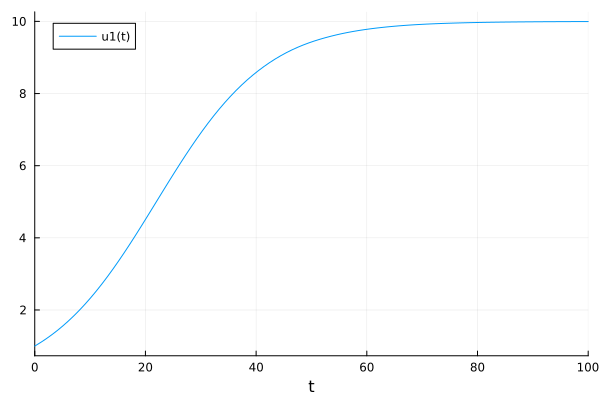

In [6]:
plot(sol)

In [10]:
length(sol) # nb of interpolation points

11

In [7]:
nb_sampling_point = 10
sol = solve(prob, Tsit5(); saveat = nb_sampling_point)
odedata = Array(sol) + 0.8 * randn(size(Array(sol)))

1×11 Matrix{Float64}:
 1.08033  2.75114  4.53452  5.44553  …  9.33708  10.1415  11.5834  10.9851

In [12]:
length(sol)

11

In [44]:
size(odedata)

(1, 11)

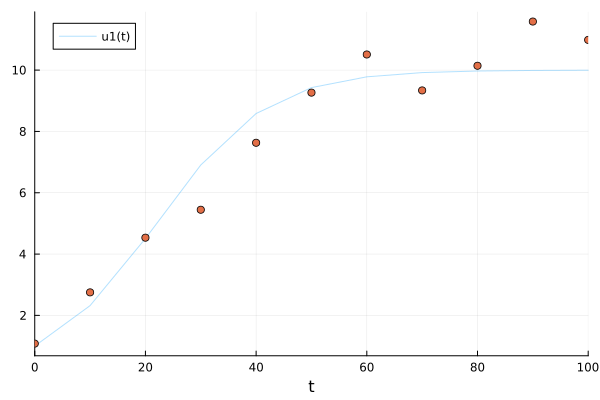

In [8]:
# Plot simulation and noisy observations.
plot(sol; alpha = 0.3)
scatter!(sol.t, odedata'; label = "")

In [9]:
@model function fitlogistic(data, prob)
    # prior for growth rate
    r ~ Uniform(0,1)
    # prior for carrying capacity
    K ~ Uniform(5,15)
    # prior for lik noise
    sigma ~ InverseGamma(2,3)

    # Simulate logistic model. 
    p = [r, K]
    predicted = solve(prob, Tsit5(); p = p, saveat = nb_sampling_point)

    # Observations.
    for i in 1:length(predicted)
        data[:, i] ~ MvNormal(predicted[i], sigma^2 * I)
    end
    return nothing
end

fitlogistic (generic function with 2 methods)

In [12]:
model = fitlogistic(odedata, prob)

DynamicPPL.Model{typeof(fitlogistic), (:data, :prob), (), (), Tuple{Matrix{Float64}, ODEProblem{Vector{Int64}, Tuple{Int64, Int64}, true, Vector{Float64}, ODEFunction{true, SciMLBase.AutoSpecialize, typeof(logistic!), UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing}, Base.Pairs{Symbol, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}, SciMLBase.StandardODEProblem}}, Tuple{}, DynamicPPL.DefaultContext}(fitlogistic, (data = [1.0803347028209778 2.7511439009477594 … 11.58337671678439 10.985141818577953], prob = ODEProblem{Vector{Int64}, Tuple{Int64, Int64}, true, Vector{Float64}, ODEFunction{true, SciMLBase.AutoSpecialize, typeof(logistic!), UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, typeof(SciMLBase.DEFAULT_OBSERVED), Nothing, Nothing}, Base

In [13]:
# Sample 2 independent chains with forward-mode automatic differentiation (the default).
chain = sample(model, NUTS(), MCMCSerial(), 1000, 2; progress = true)

┌ Info: Found initial step size
└   ϵ = 0.4
Sampling (Chain 1 of 2): 100%|██████████████████████████| Time: 0:00:00
┌ Info: Found initial step size
└   ϵ = 0.05
Sampling (Chain 2 of 2): 100%|██████████████████████████| Time: 0:00:00


Chains MCMC chain (1000×15×2 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 2
Samples per chain = 1000
Wall duration     = 11.92 seconds
Compute duration  = 10.09 seconds
parameters        = r, K, sigma
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk   ess_tail      rhat    ⋯
      Symbol   Float64   Float64   Float64     Float64    Float64   Float64    ⋯

           r    0.0831    0.0079    0.0002   1106.0081   851.7571    1.0001    ⋯
           K   10.7191    0.4572    0.0138   1149.4509   953.1858    1.0003    ⋯
       sigma    0.8131    0.2172    0.0073    956.4978   995.1418    1.0003    ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.

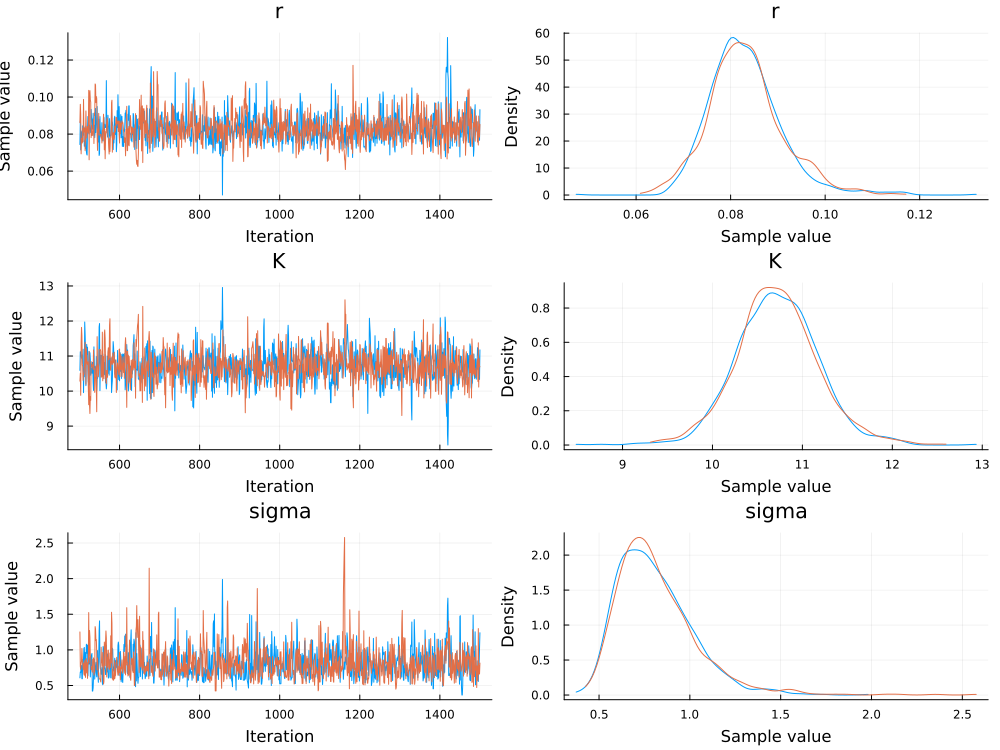

In [14]:
plot(chain)

In [19]:
length(chain[:,:,2])

1000

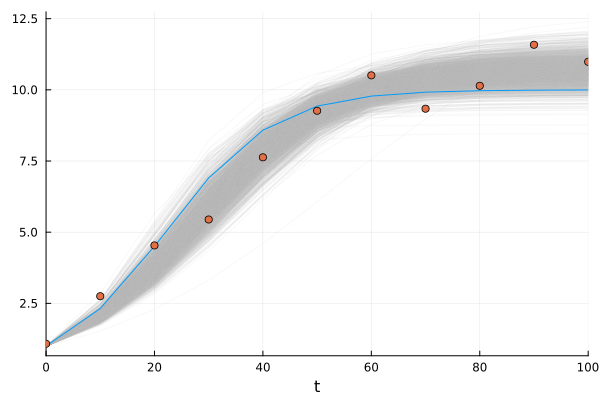

In [15]:
plot(; legend=false)
posterior_samples = chain[[:r, :K]]
for p in eachrow(Array(posterior_samples))
    sol_p = solve(prob, Tsit5(); p = p, saveat = nb_sampling_point)
    plot!(sol_p; alpha = 0.1, color = "#BBBBBB")
end

# Plot simulation and noisy observations.
plot!(sol; linewidth=1)
scatter!(sol.t, odedata')

## 2. Lotka-Volterra
<https://turinglang.org/dev/tutorials/10-bayesian-differential-equations/>

In [16]:
using Turing
using DifferentialEquations

# Load StatsPlots for visualizations and diagnostics.
using StatsPlots

using LinearAlgebra

# Set a seed for reproducibility.
using Random
Random.seed!(14);

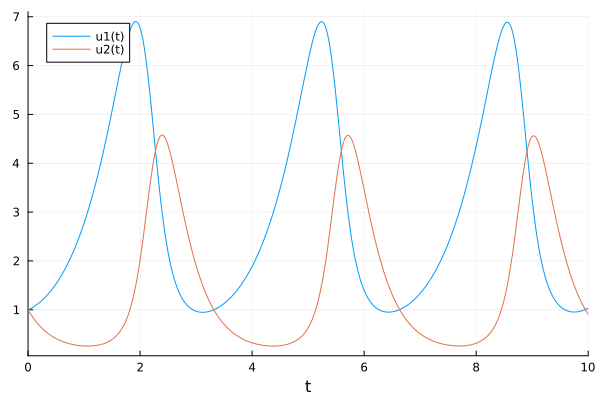

In [17]:
# Define Lotka-Volterra model.
function lotka_volterra(du, u, p, t)
    # Model parameters.
    α, β, γ, δ = p
    # Current state.
    x, y = u

    # Evaluate differential equations.
    du[1] = (α - β * y) * x # prey
    du[2] = (δ * x - γ) * y # predator

    return nothing
end

# Define initial-value problem.
u0 = [1.0, 1.0]
p = [1.5, 1.0, 3.0, 1.0]
tspan = (0.0, 10.0)
prob = ODEProblem(lotka_volterra, u0, tspan, p)

# Plot simulation.
plot(solve(prob, Tsit5()))

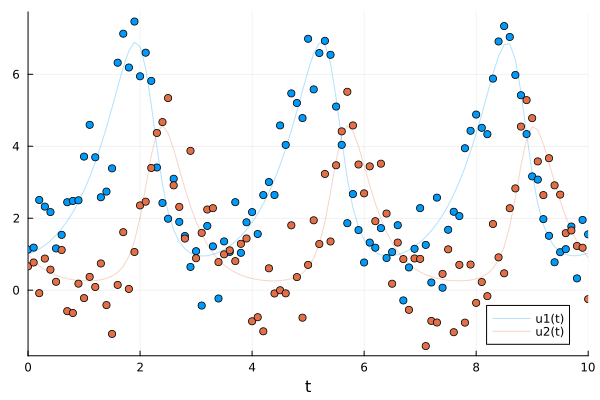

In [18]:
sol = solve(prob, Tsit5(); saveat=0.1)
odedata = Array(sol) + 0.8 * randn(size(Array(sol)))

# Plot simulation and noisy observations.
plot(sol; alpha=0.3)
scatter!(sol.t, odedata'; color=[1 2], label="")

In [20]:
@model function fitlv(data, prob)
    # Prior distributions.
    σ ~ InverseGamma(2, 3)
    α ~ truncated(Normal(1.5, 0.5); lower=0.5, upper=2.5)
    β ~ truncated(Normal(1.2, 0.5); lower=0, upper=2)
    γ ~ truncated(Normal(3.0, 0.5); lower=1, upper=4)
    δ ~ truncated(Normal(1.0, 0.5); lower=0, upper=2)

    # Simulate Lotka-Volterra model. 
    p = [α, β, γ, δ]
    predicted = solve(prob, Tsit5(); p=p, saveat=0.1)

    # Observations.
    for i in 1:length(predicted)
        data[:, i] ~ MvNormal(predicted[i], σ^2 * I)
    end

    return nothing
end

model = fitlv(odedata, prob)

# Sample 3 independent chains with forward-mode automatic differentiation (the default).
chain = sample(model, NUTS(), MCMCSerial(), 1000, 2; progress=true)

┌ Info: Found initial step size
└   ϵ = 0.025
Sampling (Chain 1 of 2): 100%|██████████████████████████| Time: 0:00:12
┌ Info: Found initial step size
└   ϵ = 0.00625
Sampling (Chain 2 of 2): 100%|██████████████████████████| Time: 0:00:13


Chains MCMC chain (1000×17×2 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 2
Samples per chain = 1000
Wall duration     = 28.0 seconds
Compute duration  = 27.97 seconds
parameters        = σ, α, β, γ, δ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk   ess_tail      rhat    ⋯
      Symbol   Float64   Float64   Float64     Float64    Float64   Float64    ⋯

           σ    0.7782    0.0397    0.0012   1177.7108   972.5380    1.0024    ⋯
           α    1.4681    0.0444    0.0019    527.6227   618.0786    1.0100    ⋯
           β    1.0000    0.0433    0.0016    709.7758   899.7712    1.0059    ⋯
           γ    3.1243    0.1402    0.0061    543.9745   618.5173    1.0087    ⋯
           δ    1.0449    0.0518    0.0023    542.5030   626

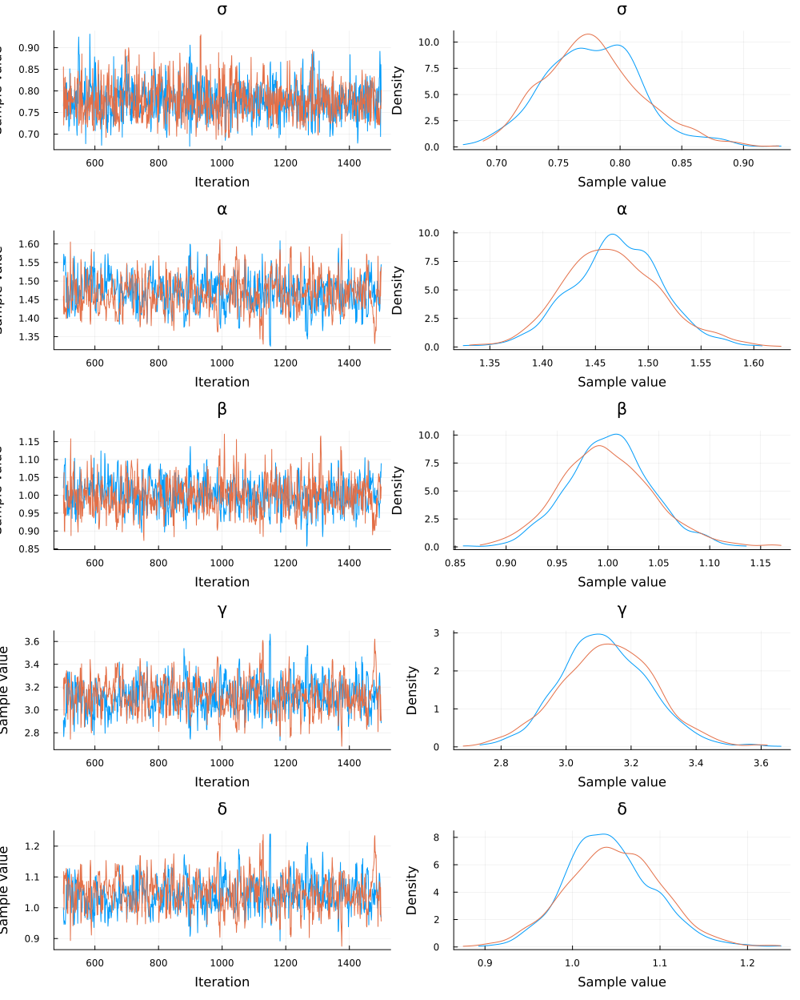

In [21]:
plot(chain)

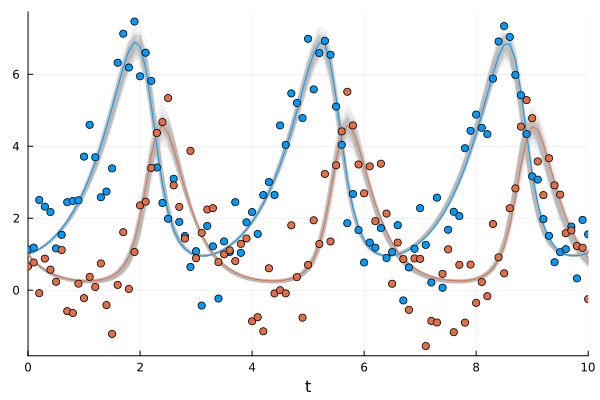

In [22]:
plot(; legend=false)
posterior_samples = sample(chain[[:α, :β, :γ, :δ]], 300; replace=false)
for p in eachrow(Array(posterior_samples))
    sol_p = solve(prob, Tsit5(); p=p, saveat=0.1)
    plot!(sol_p; alpha=0.1, color="#BBBBBB")
end

# Plot simulation and noisy observations.
plot!(sol; color=[1 2], linewidth=1)
scatter!(sol.t, odedata'; color=[1 2])

In [24]:
# wo prey
@model function fitlv2(data::AbstractVector, prob)
    # Prior distributions.
    σ ~ InverseGamma(2, 3)
    α ~ truncated(Normal(1.5, 0.5); lower=0.5, upper=2.5)
    β ~ truncated(Normal(1.2, 0.5); lower=0, upper=2)
    γ ~ truncated(Normal(3.0, 0.5); lower=1, upper=4)
    δ ~ truncated(Normal(1.0, 0.5); lower=0, upper=2)

    # Simulate Lotka-Volterra model but save only the second state of the system (predators).
    p = [α, β, γ, δ]
    predicted = solve(prob, Tsit5(); p=p, saveat=0.1, save_idxs=2)

    # Observations of the predators.
    data ~ MvNormal(predicted.u, σ^2 * I)

    return nothing
end

model2 = fitlv2(odedata[2, :], prob)

# Sample 3 independent chains.
chain2 = sample(model2, NUTS(0.45), MCMCSerial(), 5000, 2; progress=true)

┌ Info: Found initial step size
└   ϵ = 0.05
Sampling (Chain 1 of 2): 100%|██████████████████████████| Time: 0:00:11
┌ Info: Found initial step size
└   ϵ = 0.2
Sampling (Chain 2 of 2): 100%|██████████████████████████| Time: 0:00:11


Chains MCMC chain (5000×17×2 Array{Float64, 3}):

Iterations        = 1001:1:6000
Number of chains  = 2
Samples per chain = 5000
Wall duration     = 23.97 seconds
Compute duration  = 23.88 seconds
parameters        = σ, α, β, γ, δ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse   ess_bulk   ess_tail      rhat   e ⋯
      Symbol   Float64   Float64   Float64    Float64    Float64   Float64     ⋯

           σ    0.8217    0.0564    0.0069    63.4258    55.6839    1.0291     ⋯
           α    1.6752    0.1926    0.0278    46.9018    67.4547    1.1042     ⋯
           β    1.1706    0.1501    0.0210    49.4626    89.7276    1.0918     ⋯
           γ    2.9117    0.2677    0.0396    47.2808   102.8308    1.1199     ⋯
           δ    0.7962    0.2145    0.0316    48.3250    8

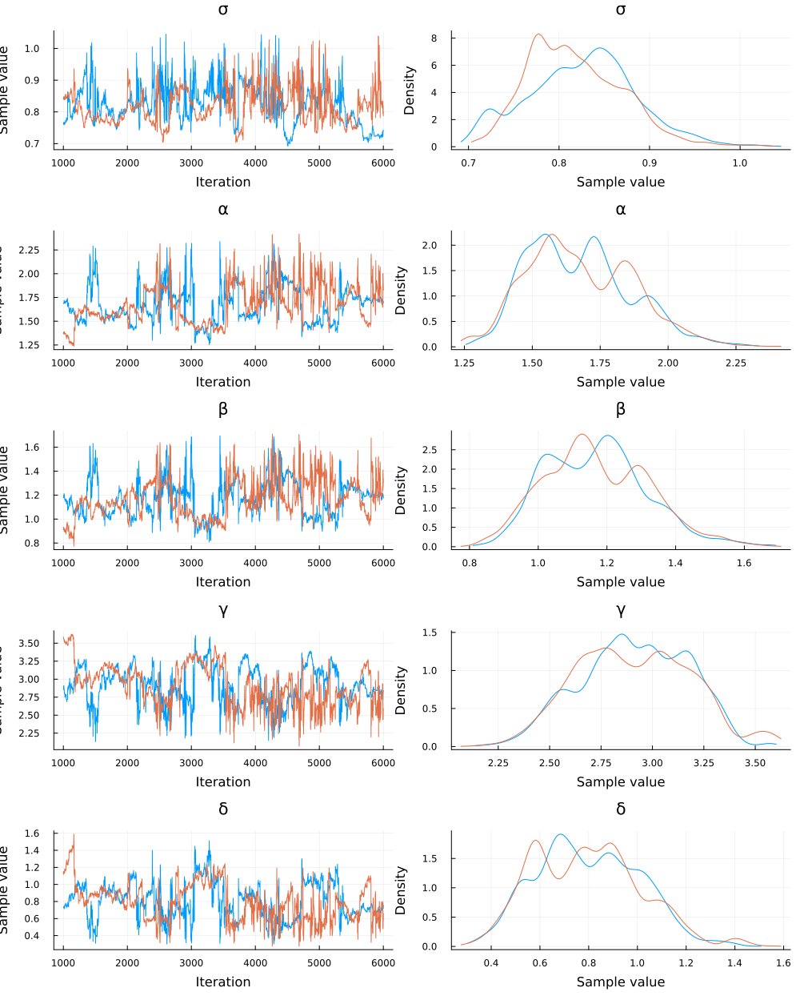

In [25]:
plot(chain2)

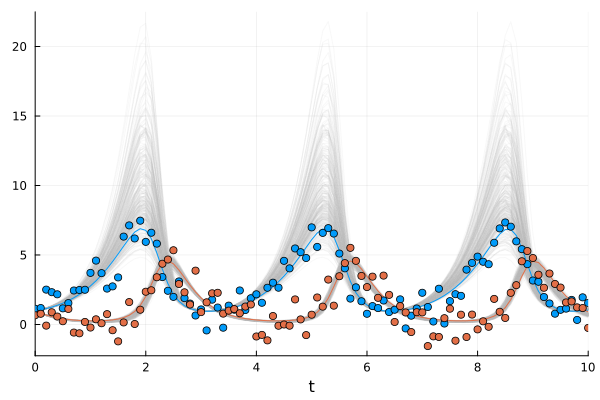

In [26]:
plot(; legend=false)
posterior_samples = sample(chain2[[:α, :β, :γ, :δ]], 300; replace=false)
for p in eachrow(Array(posterior_samples))
    sol_p = solve(prob, Tsit5(); p=p, saveat=0.1)
    plot!(sol_p; alpha=0.1, color="#BBBBBB")
end

# Plot simulation and noisy observations.
plot!(sol; color=[1 2], linewidth=1)
scatter!(sol.t, odedata'; color=[1 2])

## 3. Reaction-diffusion 1D
https://github.com/lmaillere/Fisher-KPP

In [27]:
using MethodOfLines, 
      ModelingToolkit,
      DomainSets, 
      OrdinaryDiffEq, 
      Plots, 
      LaTeXStrings,
      SciMLBase

In [28]:
@parameters t x

2-element Vector{Num}:
 t
 x

In [29]:
@parameters r D

2-element Vector{Num}:
 r
 D

In [30]:
@variables u(..)


1-element Vector{Symbolics.CallWithMetadata{SymbolicUtils.FnType{Tuple, Real}, Base.ImmutableDict{DataType, Any}}}:
 u⋆

In [31]:
Dt = Differential(t)
Dx = Differential(x)
Dxx = Differential(x)^2


Differential(x) ∘ Differential(x)

In [32]:
eq = Dt(u(t, x)) ~ r * u(t,x) * (1-u(t,x)) + D * Dxx(u(t,x))


Differential(t)(u(t, x)) ~ D*Differential(x)(Differential(x)(u(t, x))) + r*u(t, x)*(1 - u(t, x))

In [33]:
x_max = 30.0
t_max = 14.0


14.0

In [34]:
domain = [x ∈ Interval(0.0, x_max),
          t ∈ Interval(0.0, t_max)]


2-element Vector{Symbolics.VarDomainPairing}:
 Symbolics.VarDomainPairing(x, 0.0 .. 30.0)
 Symbolics.VarDomainPairing(t, 0.0 .. 14.0)

In [36]:
ic_bc = [u(0.0, x) ~ 0.0, # initial condition
         u(t, 0.0) ~ 1.0, # boundary condition
         u(t, x_max) ~ 0.0] # boundary condition


3-element Vector{Equation}:
 u(0.0, x) ~ 0.0
 u(t, 0.0) ~ 1.0
 u(t, 30.0) ~ 0.0

In [43]:
@named sys = PDESystem(eq, ic_bc, domain, [t, x], [u(t,x)], [r => 1.0, D => 1.0])


┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


PDESystem
Equations: Equation[Differential(t)(u(t, x)) ~ D*Differential(x)(Differential(x)(u(t, x))) + r*u(t, x)*(1 - u(t, x))]
Boundary Conditions: Equation[u(0.0, x) ~ 0.0, u(t, 0.0) ~ 1.0, u(t, 30.0) ~ 0.0]
Domain: Symbolics.VarDomainPairing[Symbolics.VarDomainPairing(x, 0.0 .. 30.0), Symbolics.VarDomainPairing(t, 0.0 .. 14.0)]
Dependent Variables: Num[u(t, x)]
Independent Variables: Num[t, x]
Parameters: Pair{Num, Float64}[r => 1.0, D => 1.0]
Default Parameter ValuesDict{Any, Any}()

In [79]:
?MOLFiniteDifference

search: MOLFiniteDifference



```
MOLFiniteDifference(dxs, time=nothing;
                    approx_order = 2, advection_scheme = UpwindScheme(),
                    grid_align = CenterAlignedGrid(), kwargs...)
```

A discretization algorithm.

## Arguments

  * `dxs`: A vector of pairs of parameters to the grid step in this dimension, i.e. `[x=>0.2, y=>0.1]`.   For a non-uniform rectilinear grid, replace any or all of the step sizes with the grid you'd like to   use with that variable, must be an `AbstractVector` but not a `StepRangeLen`.
  * `time`: Your choice of continuous variable, usually time. If `time = nothing`, then discretization   yields a `NonlinearProblem`. Defaults to `nothing`.

## Keyword Arguments

  * `approx_order`: The order of the derivative approximation.
  * `advection_scheme`: The scheme to be used to discretize advection terms, i.e. first order spatial derivatives and associated coefficients. Defaults to `UpwindScheme()`. WENOScheme() is also available, and is more stable and accurate at the cost of complexity.
  * `grid_align`: The grid alignment types. See [`CenterAlignedGrid()`](@ref) and [`EdgeAlignedGrid()`](@ref).
  * `use_ODAE`: If `true`, the discretization will use the `ODAEproblem` constructor.   Defaults to `false`.
  * `kwargs`: Any other keyword arguments you want to pass to the `ODEProblem`.


In [44]:
dx = 0.5
discretization = MOLFiniteDifference([x => dx], t)


MOLFiniteDifference{MethodOfLines.CenterAlignedGrid, MethodOfLines.ScalarizedDiscretization}(Dict{Num, Float64}(x => 0.5), t, 2, UpwindScheme(1), MethodOfLines.CenterAlignedGrid(), true, false, MethodOfLines.ScalarizedDiscretization(), true, Any[], Base.Pairs{Symbol, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}())

In [81]:
?discretize

search: discretize symbolic_discretize discretization discretediag



No documentation found.

`SciMLBase.discretize` is a `Function`.

```
# 1 method for generic function "discretize" from SciMLBase:
 [1] discretize(pdesys::PDESystem, discretization::PDEBase.AbstractEquationSystemDiscretization; analytic, kwargs...)
     @ PDEBase ~/.julia/packages/PDEBase/jX5Yp/src/discretization_state.jl:55
```


In [45]:
prob = discretize(sys, discretization)


┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 14.0)
u0: 59-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [46]:
sol = solve(prob, Tsit5(), saveat = 1)


retcode: Success
Interpolation: Dict{Num, Interpolations.GriddedInterpolation{Float64, 2, Matrix{Float64}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Tuple{Vector{Float64}, Vector{Float64}}}}
t: 15-element Vector{Float64}:
  0.0
  1.0
  2.0
  3.0
  4.0
  5.0
  6.0
  7.0
  8.0
  9.0
 10.0
 11.0
 12.0
 13.0
 14.0ivs: 2-element Vector{SymbolicUtils.BasicSymbolic{Real}}:
 t
 xdomain:([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0], 0.0:0.5:30.0)
u: Dict{Num, Matrix{Float64}} with 1 entry:
  u(t, x) => [1.0 0.0 … 0.0 0.0; 1.0 0.793196 … 9.86053e-49 0.0; … ; 1.0 0.9998…

In [47]:
gridx = sol[x]
gridt = sol[t]
solu = sol[u(t,x)]
# 15 time points, 61 interpolation points

15×61 Matrix{Float64}:
 1.0  0.0       0.0       0.0       …   0.0           0.0          0.0
 1.0  0.793196  0.587955  0.399581      2.19667e-47   9.86053e-49  0.0
 1.0  0.898236  0.791246  0.674697     -9.01408e-34  -9.36527e-35  0.0
 1.0  0.946895  0.888317  0.82511       8.73613e-25   1.51342e-25  0.0
 1.0  0.971749  0.942264  0.906885      1.706e-19     3.99891e-20  0.0
 1.0  0.985661  0.970287  0.952693  …   7.14033e-16   1.99978e-16  0.0
 1.0  0.993099  0.984709  0.97714       3.78234e-13   1.19721e-13  0.0
 1.0  0.996465  0.992847  0.988455      5.45083e-11   1.88743e-11  0.0
 1.0  0.998158  0.996845  0.99408       3.22553e-9    1.196e-9     0.0
 1.0  0.999147  0.998467  0.997252      1.00578e-7    3.93426e-8   0.0
 1.0  0.999727  0.99903   0.999071  …   1.9397e-6     7.91999e-7   0.0
 1.0  0.999938  0.999419  0.999756      2.5707e-5     1.08759e-5   0.0
 1.0  0.999915  0.999841  0.999726      0.000250523   0.000109311  0.0
 1.0  0.999882  1.00008   0.999648      0.0018625     

In [48]:
anim = @animate for i in eachindex(gridt)
    plot(gridx, solu[i, :],
         xlabel = "position "*L"$x$",
         ylabel = "population density "*L"$u$", 
         label = L"$u(x,t)$", 
         title = "t=$(gridt[i])")
end


Animation("/var/folders/ln/jf2twlj12snbq000z6qq5y7m0000gn/T/jl_4KW010", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png", "000011.png", "000012.png", "000013.png", "000014.png", "000015.png"])

[ Info: Saved animation to /Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP.gif


Plots.AnimatedGif("/Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP.gif")
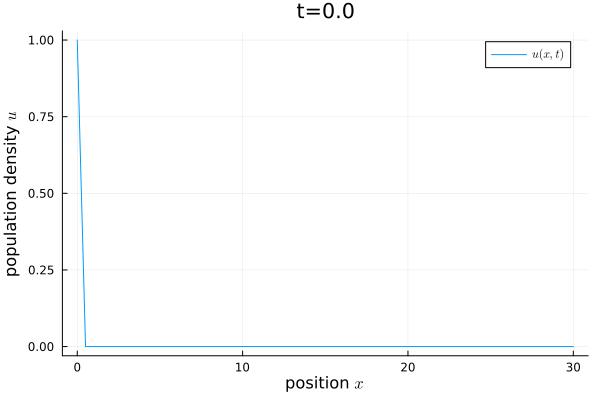

In [49]:

gif(anim, "fisherKPP.gif", fps = 10)


## 4. Reaction-diffusion 1D and inverse problem

In [50]:
using MethodOfLines, 
 ModelingToolkit,
 DomainSets, 
 OrdinaryDiffEq, 
 Plots, 
 LaTeXStrings,
 SciMLBase

In [51]:
@parameters t x
@parameters r D
@variables u(..)
Dt = Differential(t)
Dx = Differential(x)
Dxx = Differential(x)^2
eq = Dt(u(t, x)) ~ r * u(t,x) * (1-u(t,x)) + D * Dxx(u(t,x))


Differential(t)(u(t, x)) ~ D*Differential(x)(Differential(x)(u(t, x))) + r*u(t, x)*(1 - u(t, x))

In [52]:
x_max = 30.0
t_max = 14.0
domain = [x ∈ Interval(0.0, x_max),
 t ∈ Interval(0.0, t_max)]
ic_bc = [u(0.0, x) ~ 0.0,
 u(t, 0.0) ~ 1.0,
 u(t, x_max) ~ 0.0]


3-element Vector{Equation}:
 u(0.0, x) ~ 0.0
 u(t, 0.0) ~ 1.0
 u(t, 30.0) ~ 0.0

In [53]:
@named sys = PDESystem(eq, ic_bc, domain, [t, x], [u(t,x)], [r => 1.0, D => 1.0])


┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


PDESystem
Equations: Equation[Differential(t)(u(t, x)) ~ D*Differential(x)(Differential(x)(u(t, x))) + r*u(t, x)*(1 - u(t, x))]
Boundary Conditions: Equation[u(0.0, x) ~ 0.0, u(t, 0.0) ~ 1.0, u(t, 30.0) ~ 0.0]
Domain: Symbolics.VarDomainPairing[Symbolics.VarDomainPairing(x, 0.0 .. 30.0), Symbolics.VarDomainPairing(t, 0.0 .. 14.0)]
Dependent Variables: Num[u(t, x)]
Independent Variables: Num[t, x]
Parameters: Pair{Num, Float64}[r => 1.0, D => 1.0]
Default Parameter ValuesDict{Any, Any}()

In [54]:
dx = 0.5
discretization = MOLFiniteDifference([x => dx], t)
prob = discretize(sys, discretization)

┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 14.0)
u0: 59-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [55]:
sol = solve(prob, Tsit5(), saveat = .5)
gridx = sol[x]
gridt = sol[t]
solu = sol[u(t,x)]

29×61 Matrix{Float64}:
 1.0  0.0       0.0       0.0       …   0.0           0.0          0.0
 1.0  0.661949  0.372533  0.175506      6.36016e-65   1.0246e-66   0.0
 1.0  0.793196  0.587955  0.399581      2.19667e-47   9.86053e-49  0.0
 1.0  0.857935  0.710259  0.559605      5.20224e-38   4.1406e-39   0.0
 1.0  0.898236  0.791246  0.674697     -9.01408e-34  -9.36527e-35  0.0
 1.0  0.925729  0.848894  0.759092  …   7.91174e-29   1.00709e-29  0.0
 1.0  0.946895  0.888317  0.82511       8.73613e-25   1.51342e-25  0.0
 1.0  0.96109   0.919607  0.871737      7.70032e-22   1.59349e-22  0.0
 1.0  0.971749  0.942264  0.906885      1.706e-19     3.99891e-20  0.0
 1.0  0.980155  0.957806  0.934215      1.53587e-17   3.97838e-18  0.0
 1.0  0.985661  0.970287  0.952693  …   7.14033e-16   1.99978e-16  0.0
 1.0  0.989662  0.979299  0.966091      2.00321e-14   5.99415e-15  0.0
 1.0  0.993099  0.984709  0.97714       3.78234e-13   1.19721e-13  0.0
 ⋮                                  ⋱                 

[ Info: Saved animation to /Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP.gif


Plots.AnimatedGif("/Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP.gif")
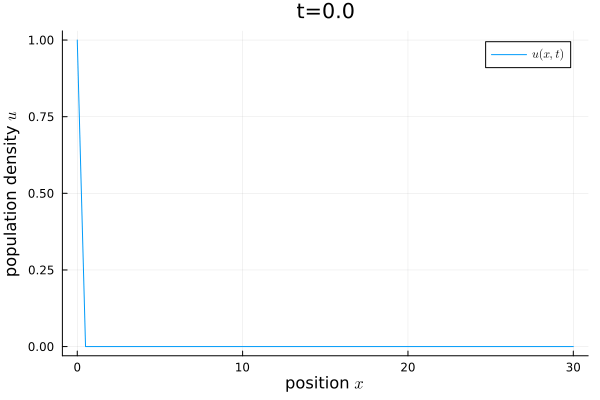

In [56]:
anim = @animate for i in eachindex(gridt)
 plot(gridx, solu[i, :],
 xlabel = "position "*L"$x$",
 ylabel = "population density "*L"$u$", 
 label = L"$u(x,t)$", 
 title = "t=$(gridt[i])")
end

gif(anim, "fisherKPP.gif", fps = 10)

In [58]:
at_sampling_point = .8
sol = solve(prob, Tsit5(); saveat = at_sampling_point)
gridx = sol[x]
gridt = sol[t]
solu = sol[u(t,x)]

Array(solu)

# 19 census points, 61 interpolation points

19×61 Matrix{Float64}:
 1.0  0.0       0.0       0.0       …  0.0          0.0          0.0
 1.0  0.753873  0.518324  0.318332     7.8167e-53   2.57243e-54  0.0
 1.0  0.867396  0.728965  0.585646     1.58775e-37  1.28038e-38  0.0
 1.0  0.922432  0.836307  0.746962     1.07168e-29  1.34476e-30  0.0
 1.0  0.953199  0.901813  0.845635     1.61957e-23  3.03844e-24  0.0
 1.0  0.971749  0.942264  0.906885  …  1.706e-19    3.99891e-20  0.0
 1.0  0.983483  0.96611   0.94555      1.64623e-16  4.47242e-17  0.0
 1.0  0.990759  0.979937  0.969403     3.71211e-14  1.12438e-14  0.0
 1.0  0.994762  0.988579  0.982718     3.13995e-12  1.03343e-12  0.0
 1.0  0.996891  0.993917  0.989884     1.31102e-10  4.60893e-11  0.0
 1.0  0.998158  0.996845  0.99408   …  3.22553e-9   1.196e-9     0.0
 1.0  0.998986  0.998262  0.996744     5.27513e-8   2.04347e-8   0.0
 1.0  0.999537  0.998869  0.998478     6.24212e-7   2.50799e-7   0.0
 1.0  0.99986   0.999164  0.99949      5.6787e-6    2.35356e-6   0.0
 1.0  0.999

In [59]:
odedata = Array(solu) + 0.1 * randn(size(Array(solu)))

19×61 Matrix{Float64}:
 1.02976   -0.164323  -0.00461219  0.0361964  …  -0.06788       0.226459
 1.04962    0.721432   0.501661    0.247025      -0.098074      0.0618274
 1.07818    0.936524   0.943952    0.565528       0.15945       0.00327274
 1.06238    0.854171   0.915002    0.635152      -0.0379088    -0.139671
 1.09062    1.13985    0.867699    0.975843       0.217188      0.108648
 0.988371   0.894912   0.978693    0.769395   …  -0.127564     -0.00591153
 0.975395   0.884435   1.01462     1.0018        -0.00870891    0.0983209
 0.88916    1.07004    1.07736     1.02047       -0.0137073     0.0914143
 0.857031   0.808953   0.908538    1.18703        0.0600676     0.145724
 0.981783   1.1752     0.95581     0.876848       0.0952411     0.0558163
 0.985246   1.03075    1.05572     1.02063    …   0.0461616    -0.138152
 0.894882   1.02993    1.02153     1.02726       -0.213041      0.0759116
 0.953083   0.879228   0.941268    0.955735       0.0289641    -0.0231855
 0.930586   0.9056

In [60]:
sol.t

19-element Vector{Float64}:
  0.0
  0.8
  1.6
  2.4
  3.2
  4.0
  4.8
  5.6
  6.4
  7.2
  8.0
  8.8
  9.6
 10.4
 11.2
 12.0
 12.8
 13.6
 14.0

In [61]:
odedata

19×61 Matrix{Float64}:
 1.02976   -0.164323  -0.00461219  0.0361964  …  -0.06788       0.226459
 1.04962    0.721432   0.501661    0.247025      -0.098074      0.0618274
 1.07818    0.936524   0.943952    0.565528       0.15945       0.00327274
 1.06238    0.854171   0.915002    0.635152      -0.0379088    -0.139671
 1.09062    1.13985    0.867699    0.975843       0.217188      0.108648
 0.988371   0.894912   0.978693    0.769395   …  -0.127564     -0.00591153
 0.975395   0.884435   1.01462     1.0018        -0.00870891    0.0983209
 0.88916    1.07004    1.07736     1.02047       -0.0137073     0.0914143
 0.857031   0.808953   0.908538    1.18703        0.0600676     0.145724
 0.981783   1.1752     0.95581     0.876848       0.0952411     0.0558163
 0.985246   1.03075    1.05572     1.02063    …   0.0461616    -0.138152
 0.894882   1.02993    1.02153     1.02726       -0.213041      0.0759116
 0.953083   0.879228   0.941268    0.955735       0.0289641    -0.0231855
 0.930586   0.9056

[ Info: Saved animation to /Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP.gif


Plots.AnimatedGif("/Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP.gif")
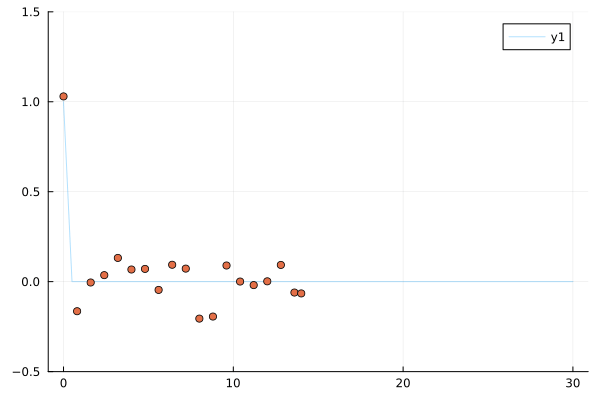

In [62]:
anim = @animate for i in eachindex(sol.t)
 plot(gridx, solu[i, :],
 alpha = 0.3,
 ylim = (-0.5,1.5))
 scatter!(gridt, odedata[i,:]; label = "")
end

gif(anim, "fisherKPP.gif", fps = 5)

In [349]:
size(solu)

(19, 61)

In [63]:
@model function fitfisherKPP1D(data, prob)
 # prior for growth rate
 r ~ Uniform(0,2)
 # prior for carrying capacity
 D ~ Uniform(0,2)
 # prior for lik noise
 sigma ~ InverseGamma(2,3)

 # Simulate logistic model. 
 p = [r, D]
 predicted = solve(prob, Tsit5(); p = p, saveat = at_sampling_point)
 gridx = predicted[x]
 gridt = predicted[t]
 solu = predicted[u(t,x)]

 # Observations.
 for i in 1:size(solu)[1]
 data[i,:] ~ MvNormal(solu[i,:], sigma^2 * I)
 end
 return nothing
end


fitfisherKPP1D (generic function with 2 methods)

┌ Info: Found initial step size
└   ϵ = 0.05
Sampling (Chain 1 of 2): 100%|██████████████████████████| Time: 0:00:31
┌ Info: Found initial step size
└   ϵ = 0.0125
Sampling (Chain 2 of 2): 100%|██████████████████████████| Time: 0:00:33


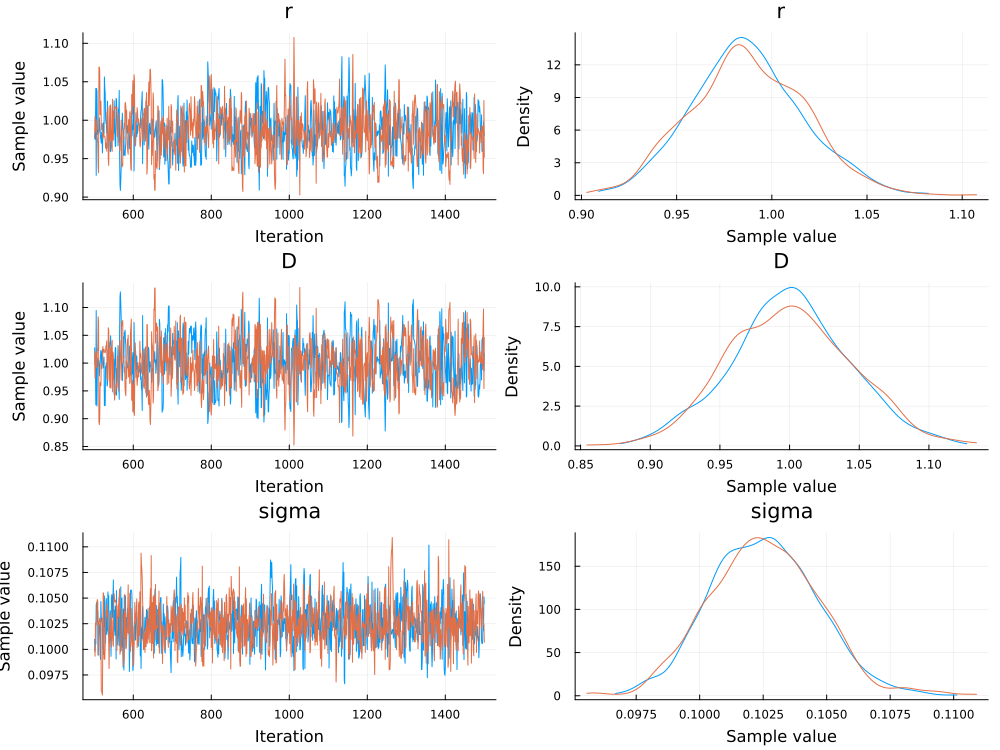

In [64]:
model = fitfisherKPP1D(odedata, prob)
chain = sample(model, NUTS(), MCMCSerial(), 1000, 2; progress = true)
plot(chain)


## 5. Reaction-diffusion 2D

In [66]:
using MethodOfLines, 
      ModelingToolkit,
      DomainSets, 
      OrdinaryDiffEq, 
      Plots, 
      LaTeXStrings

In [67]:
@parameters t x y
@parameters r D
@variables u(..)

1-element Vector{Symbolics.CallWithMetadata{SymbolicUtils.FnType{Tuple, Real}, Base.ImmutableDict{DataType, Any}}}:
 u⋆

In [68]:
Dt = Differential(t)
Dx = Differential(x)
Dxx = Differential(x)^2
Dy = Differential(y)
Dyy = Differential(y)^2

Differential(y) ∘ Differential(y)

In [69]:
eq = Dt(u(t, x, y)) ~ r * u(t,x, y) * (1-u(t,x, y)) + D * (Dxx(u(t,x,y)) + Dyy(u(t,x,y)))

Differential(t)(u(t, x, y)) ~ D*(Differential(x)(Differential(x)(u(t, x, y))) + Differential(y)(Differential(y)(u(t, x, y)))) + r*u(t, x, y)*(1 - u(t, x, y))

In [70]:
x_max = 30.0
y_max = 30.0
t_max = 14.0

14.0

In [71]:
domain = [x ∈ Interval(0.0, x_max),
          y ∈ Interval(0.0, y_max),
          t ∈ Interval(0.0, t_max)]

3-element Vector{Symbolics.VarDomainPairing}:
 Symbolics.VarDomainPairing(x, 0.0 .. 30.0)
 Symbolics.VarDomainPairing(y, 0.0 .. 30.0)
 Symbolics.VarDomainPairing(t, 0.0 .. 14.0)

In [72]:
ic_bc = [u(0.0, x, y) ~ 0.0,
         u(t, 0.0, y) ~ 1.0,
         u(t, x, 0.0) ~ 1.0]

# à revoir surement...

# u(t, 0.0) ~ 1.0,
# u(t, x_max) ~ 0.0]

3-element Vector{Equation}:
 u(0.0, x, y) ~ 0.0
 u(t, 0.0, y) ~ 1.0
 u(t, x, 0.0) ~ 1.0

In [73]:
@named sys = PDESystem(eq, ic_bc, domain, [t, x, y], [u(t,x, y)], [r => 1.0, D => 1.0])

┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


PDESystem
Equations: Equation[Differential(t)(u(t, x, y)) ~ D*(Differential(x)(Differential(x)(u(t, x, y))) + Differential(y)(Differential(y)(u(t, x, y)))) + r*u(t, x, y)*(1 - u(t, x, y))]
Boundary Conditions: Equation[u(0.0, x, y) ~ 0.0, u(t, 0.0, y) ~ 1.0, u(t, x, 0.0) ~ 1.0]
Domain: Symbolics.VarDomainPairing[Symbolics.VarDomainPairing(x, 0.0 .. 30.0), Symbolics.VarDomainPairing(y, 0.0 .. 30.0), Symbolics.VarDomainPairing(t, 0.0 .. 14.0)]
Dependent Variables: Num[u(t, x, y)]
Independent Variables: Num[t, x, y]
Parameters: Pair{Num, Float64}[r => 1.0, D => 1.0]
Default Parameter ValuesDict{Any, Any}()

In [74]:
dx = 1.5
dy = 1.5
discretization = MOLFiniteDifference([x => dx, y => dy], t)

MOLFiniteDifference{MethodOfLines.CenterAlignedGrid, MethodOfLines.ScalarizedDiscretization}(Dict{Num, Float64}(y => 1.5, x => 1.5), t, 2, UpwindScheme(1), MethodOfLines.CenterAlignedGrid(), true, false, MethodOfLines.ScalarizedDiscretization(), true, Any[], Base.Pairs{Symbol, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}())

In [75]:
prob = discretize(sys, discretization)

┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 14.0)
u0: 400-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [76]:
sol = solve(prob, Tsit5(), saveat = 1)

retcode: Success
Interpolation: Dict{Num, Interpolations.GriddedInterpolation{Float64, 3, Array{Float64, 3}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}}}}
t: 15-element Vector{Float64}:
  0.0
  1.0
  2.0
  3.0
  4.0
  5.0
  6.0
  7.0
  8.0
  9.0
 10.0
 11.0
 12.0
 13.0
 14.0ivs: 3-element Vector{SymbolicUtils.BasicSymbolic{Real}}:
 t
 x
 ydomain:([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0], 0.0:1.5:30.0, 0.0:1.5:30.0)
u: Dict{Num, Array{Float64, 3}} with 1 entry:
  u(t, x, y) => [0.0 1.0 … 1.0 1.0; 0.0 1.0 … 1.0 1.0; … ; 0.0 1.0 … 1.0 1.0; 0…

In [77]:
gridx = sol[x]
gridy = sol[y]
gridt = sol[t]
solu = sol[u(t,x,y)];

In [78]:
anim = @animate for i in eachindex(gridt)
    heatmap(gridx, gridy, solu[i, :, :], label = L"$u(x,y,t)$", xlabel="position "*L"$x$", ylabel="position "*L"$y$", title="population density at t=$(gridt[i])", color=:viridis)
end

Animation("/var/folders/ln/jf2twlj12snbq000z6qq5y7m0000gn/T/jl_JtGLqm", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png", "000011.png", "000012.png", "000013.png", "000014.png", "000015.png"])

[ Info: Saved animation to /Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP2D.gif


Plots.AnimatedGif("/Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP2D.gif")
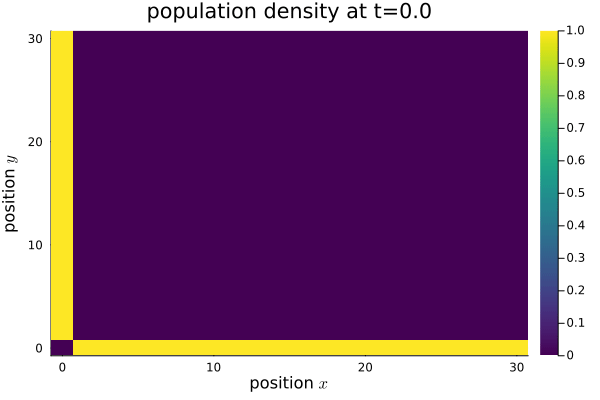

In [79]:
gif(anim, "fisherKPP2D.gif", fps = 10)


## 6. Reaction-diffusion 2D w/ inverse problem

In [80]:
using MethodOfLines, 
      ModelingToolkit,
      DomainSets, 
      OrdinaryDiffEq, 
      Plots, 
      LaTeXStrings

In [81]:
@parameters t x y
@parameters r D
@variables u(..)

1-element Vector{Symbolics.CallWithMetadata{SymbolicUtils.FnType{Tuple, Real}, Base.ImmutableDict{DataType, Any}}}:
 u⋆

In [82]:
Dt = Differential(t)
Dx = Differential(x)
Dxx = Differential(x)^2
Dy = Differential(y)
Dyy = Differential(y)^2

Differential(y) ∘ Differential(y)

In [83]:
eq = Dt(u(t, x, y)) ~ r * u(t,x, y) * (1-u(t,x, y)) + D * (Dxx(u(t,x,y)) + Dyy(u(t,x,y)))

Differential(t)(u(t, x, y)) ~ D*(Differential(x)(Differential(x)(u(t, x, y))) + Differential(y)(Differential(y)(u(t, x, y)))) + r*u(t, x, y)*(1 - u(t, x, y))

In [84]:
x_max = 30.0
y_max = 30.0
t_max = 14.0

14.0

In [85]:
domain = [x ∈ Interval(0.0, x_max),
          y ∈ Interval(0.0, y_max),
          t ∈ Interval(0.0, t_max)]

3-element Vector{Symbolics.VarDomainPairing}:
 Symbolics.VarDomainPairing(x, 0.0 .. 30.0)
 Symbolics.VarDomainPairing(y, 0.0 .. 30.0)
 Symbolics.VarDomainPairing(t, 0.0 .. 14.0)

In [86]:
ic_bc = [u(0.0, x, y) ~ 0.0,
         u(t, 0.0, y) ~ 1.0,
         u(t, x, 0.0) ~ 1.0]

# à revoir surement...

# u(t, 0.0) ~ 1.0,
# u(t, x_max) ~ 0.0]

3-element Vector{Equation}:
 u(0.0, x, y) ~ 0.0
 u(t, 0.0, y) ~ 1.0
 u(t, x, 0.0) ~ 1.0

In [87]:
@named sys = PDESystem(eq, ic_bc, domain, [t, x, y], [u(t,x, y)], [r => 1.0, D => 1.0])

┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


PDESystem
Equations: Equation[Differential(t)(u(t, x, y)) ~ D*(Differential(x)(Differential(x)(u(t, x, y))) + Differential(y)(Differential(y)(u(t, x, y)))) + r*u(t, x, y)*(1 - u(t, x, y))]
Boundary Conditions: Equation[u(0.0, x, y) ~ 0.0, u(t, 0.0, y) ~ 1.0, u(t, x, 0.0) ~ 1.0]
Domain: Symbolics.VarDomainPairing[Symbolics.VarDomainPairing(x, 0.0 .. 30.0), Symbolics.VarDomainPairing(y, 0.0 .. 30.0), Symbolics.VarDomainPairing(t, 0.0 .. 14.0)]
Dependent Variables: Num[u(t, x, y)]
Independent Variables: Num[t, x, y]
Parameters: Pair{Num, Float64}[r => 1.0, D => 1.0]
Default Parameter ValuesDict{Any, Any}()

In [88]:
dx = 1.5
dy = 1.5
discretization = MOLFiniteDifference([x => dx, y => dy], t)

MOLFiniteDifference{MethodOfLines.CenterAlignedGrid, MethodOfLines.ScalarizedDiscretization}(Dict{Num, Float64}(y => 1.5, x => 1.5), t, 2, UpwindScheme(1), MethodOfLines.CenterAlignedGrid(), true, false, MethodOfLines.ScalarizedDiscretization(), true, Any[], Base.Pairs{Symbol, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}())

In [89]:
prob = discretize(sys, discretization)

┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154
┌ Warning: : no method matching get_unit for arguments (Pair{Num, Float64},).
└ @ ModelingToolkit ~/.julia/packages/ModelingToolkit/BsHty/src/systems/validation.jl:154


ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 14.0)
u0: 400-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [91]:
sol = solve(prob, Tsit5(), saveat = 1)

retcode: Success
Interpolation: Dict{Num, Interpolations.GriddedInterpolation{Float64, 3, Array{Float64, 3}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}}}}
t: 15-element Vector{Float64}:
  0.0
  1.0
  2.0
  3.0
  4.0
  5.0
  6.0
  7.0
  8.0
  9.0
 10.0
 11.0
 12.0
 13.0
 14.0ivs: 3-element Vector{SymbolicUtils.BasicSymbolic{Real}}:
 t
 x
 ydomain:([0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0], 0.0:1.5:30.0, 0.0:1.5:30.0)
u: Dict{Num, Array{Float64, 3}} with 1 entry:
  u(t, x, y) => [0.0 1.0 … 1.0 1.0; 0.0 1.0 … 1.0 1.0; … ; 0.0 1.0 … 1.0 1.0; 0…

In [92]:
gridx = sol[x]
gridy = sol[y]
gridt = sol[t]
solu = sol[u(t,x,y)];

In [93]:
anim = @animate for i in eachindex(gridt)
    heatmap(gridx, gridy, solu[i, :, :], label = L"$u(x,y,t)$", xlabel="position "*L"$x$", ylabel="position "*L"$y$", title="population density at t=$(gridt[i])", color=:viridis)
end

Animation("/var/folders/ln/jf2twlj12snbq000z6qq5y7m0000gn/T/jl_PxshDr", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png", "000011.png", "000012.png", "000013.png", "000014.png", "000015.png"])

[ Info: Saved animation to /Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP2D.gif


Plots.AnimatedGif("/Users/oliviergimenez/Dropbox/OG/GITHUB/otter-crayfish-model/code/fisherKPP2D.gif")
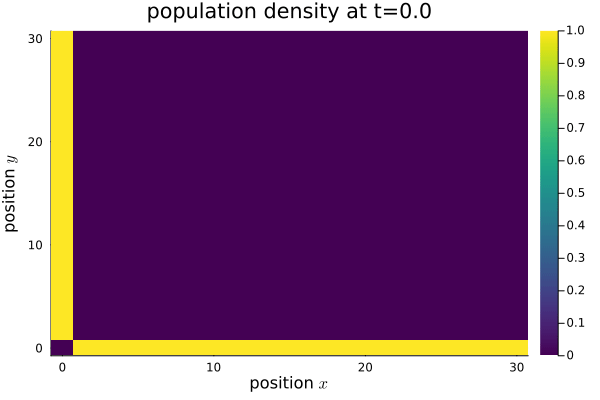

In [94]:
gif(anim, "fisherKPP2D.gif", fps = 10)


In [95]:
at_sampling_point = .8
sol = solve(prob, Tsit5(); saveat = at_sampling_point)

retcode: Success
Interpolation: Dict{Num, Interpolations.GriddedInterpolation{Float64, 3, Array{Float64, 3}, Interpolations.Gridded{Interpolations.Linear{Interpolations.Throw{Interpolations.OnGrid}}}, Tuple{Vector{Float64}, Vector{Float64}, Vector{Float64}}}}
t: 19-element Vector{Float64}:
  0.0
  0.8
  1.6
  2.4
  3.2
  4.0
  4.8
  5.6
  6.4
  7.2
  8.0
  8.8
  9.6
 10.4
 11.2
 12.0
 12.8
 13.6
 14.0ivs: 3-element Vector{SymbolicUtils.BasicSymbolic{Real}}:
 t
 x
 ydomain:([0.0, 0.8, 1.6, 2.4, 3.2, 4.0, 4.8, 5.6, 6.4, 7.2, 8.0, 8.8, 9.6, 10.4, 11.2, 12.0, 12.8, 13.6, 14.0], 0.0:1.5:30.0, 0.0:1.5:30.0)
u: Dict{Num, Array{Float64, 3}} with 1 entry:
  u(t, x, y) => [0.0 1.0 … 1.0 1.0; 0.0 1.0 … 1.0 1.0; … ; 0.0 1.0 … 1.0 1.0; 0…

In [96]:
gridx = sol[x]
gridy = sol[y]
gridt = sol[t]
solu = sol[u(t,x,y)]
Array(solu)
# 19 census points, 21*21 interpolation points


19×21×21 Array{Float64, 3}:
[:, :, 1] =
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  …  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  …  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  …  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0     1.0  1.0  1.0  1.0  1.0  1.0  1.0
 0.0  1.0  1.0  1.0  1.0

In [97]:
odedata = Array(solu) + 0.1 * randn(size(Array(solu)))

19×21×21 Array{Float64, 3}:
[:, :, 1] =
  0.130806    1.1225    0.803571  1.05533   …  0.965969  1.04189   1.0779
 -0.0206003   0.817329  0.949569  0.887162     1.07648   1.0288    1.06038
  0.011038    0.95594   1.22994   0.972257     0.94849   0.973221  1.07601
 -0.00213834  1.10058   1.0081    0.671677     1.03759   1.08631   1.14929
  0.0468703   0.88637   1.13628   1.02219      1.04079   1.02183   0.986193
  0.0541846   1.06435   1.01563   0.99526   …  0.915488  0.794429  1.16497
  0.108996    0.920515  0.916773  1.03091      0.763645  1.03092   1.03793
 -0.0396153   1.04494   1.0278    1.02035      0.886772  0.995582  0.991067
  0.0559611   0.907533  0.989513  1.02225      0.956714  1.04111   0.847164
 -0.363006    0.918823  1.04579   1.0658       1.04766   0.960818  1.15936
 -0.0332953   0.949936  1.15472   1.13825   …  1.13554   0.967893  0.932192
  0.00375289  1.03368   1.02772   0.924528     0.88506   1.15799   1.22623
  0.0342733   0.94822   1.12507   0.967146     1.08366   

In [98]:
sol.t

19-element Vector{Float64}:
  0.0
  0.8
  1.6
  2.4
  3.2
  4.0
  4.8
  5.6
  6.4
  7.2
  8.0
  8.8
  9.6
 10.4
 11.2
 12.0
 12.8
 13.6
 14.0

In [99]:
odedata
size(odedata)

(19, 21, 21)

In [100]:
size(solu)

(19, 21, 21)

In [101]:
solu[1,:,:]

21×21 Matrix{Float64}:
 0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  …  1.0  1.0  1.0  1.0  1.0  1.0  1.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 1.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  

In [140]:
@model function fitfisherKPP2D(data, prob)
 # prior for growth rate
 r ~ truncated(Normal(1.0, 0.5); lower=0, upper=2)
 # prior for carrying capacity
 D ~ truncated(Normal(1.0, 0.5); lower=0, upper=2)
 # prior for lik noise
 sigma ~ InverseGamma(2,3)

 # Simulate logistic model 
 p = [r, D]
 predicted = solve(prob, Tsit5(); p = p, saveat = at_sampling_point)
 gridx = predicted[x]
 gridy = predicted[y]
 gridt = predicted[t]
 solu = predicted[u(t,x,y)]

 # Observations
 for i in 1:size(solu)[1]
        for j in 1:size(solu)[2]
            for k in 1:size(solu)[3]
                data[i,j,k] ~ Normal(solu[i,j,k], sigma^2)
            end
        end
    end
 return nothing
end


fitfisherKPP2D (generic function with 2 methods)

In [141]:
model = fitfisherKPP2D(odedata, prob)

DynamicPPL.Model{typeof(fitfisherKPP2D), (:data, :prob), (), (), Tuple{Array{Float64, 3}, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, Vector{Float64}, ODEFunction{true, SciMLBase.AutoSpecialize, ModelingToolkit.var"#k#545"{RuntimeGeneratedFunctions.RuntimeGeneratedFunction{(:ˍ₋arg1, :ˍ₋arg2, :t), ModelingToolkit.var"#_RGF_ModTag", ModelingToolkit.var"#_RGF_ModTag", (0xd5a9e24d, 0xb1e8b889, 0xc6cf030a, 0xe4271814, 0xe0383853), Nothing}, RuntimeGeneratedFunctions.RuntimeGeneratedFunction{(:ˍ₋out, :ˍ₋arg1, :ˍ₋arg2, :t), ModelingToolkit.var"#_RGF_ModTag", ModelingToolkit.var"#_RGF_ModTag", (0x6bc2ac44, 0xb26be241, 0x4c03ad86, 0x99601f4d, 0x81dbe4f9), Nothing}}, UniformScaling{Bool}, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Nothing, Vector{Symbol}, Symbol, Vector{Symbol}, ModelingToolkit.var"#630#generated_observed#555"{Bool, ODESystem, Dict{Any, Any}, Vector{SymbolicUtils.BasicSymbolic{Real}}}, Nothing, ODESystem}, Base.Pairs{

In [142]:
chain3 = sample(model, NUTS(), MCMCSerial(), 500, 2; progress = true)
# petit pb, ODE instable, cf https://docs.sciml.ai/DiffEqDocs/stable/basics/faq/#My-model-is-reporting-unstable-results.-What-can-I-do?


┌ Info: Found initial step size
└   ϵ = 0.0125
Sampling (Chain 1 of 2):  16%|████▏                     |  ETA: 0:12:31┌ Warning: dt(1.7763568394002505e-15) <= dtmin(1.7763568394002505e-15) at t=12.680429344215298, and step error estimate = 285.1509824774253. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase ~/.julia/packages/SciMLBase/szsYq/src/integrator_interface.jl:599
Sampling (Chain 1 of 2):  16%|████▎                     |  ETA: 0:12:22┌ Warning: dt(1.7763568394002505e-15) <= dtmin(1.7763568394002505e-15) at t=13.438793173087676, and step error estimate = 285.15111362779606. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase ~/.julia/packages/SciMLBase/szsYq/src/integrator_interface.jl:599
Sampling (Chain 1 of 2):  30%|███████▉                  |  ETA: 0:08:56┌ Warning: dt(1.7763568394002505e-15) <= dtmin(1.7763568394002505e-15) at t=11.396506163573699, and ste

Chains MCMC chain (500×15×2 Array{Float64, 3}):

Iterations        = 251:1:750
Number of chains  = 2
Samples per chain = 500
Wall duration     = 1289.85 seconds
Compute duration  = 1289.83 seconds
parameters        = r, D, sigma
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse   ess_bulk   ess_tail      rhat   e ⋯
      Symbol   Float64   Float64   Float64    Float64    Float64   Float64     ⋯

           r    1.0081    0.0096    0.0006   276.1755   339.4076    1.0055     ⋯
           D    0.9944    0.0156    0.0009   277.8582   305.7667    1.0059     ⋯
       sigma    0.3175    0.0012    0.0001   519.9905   600.1744    1.0053     ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75

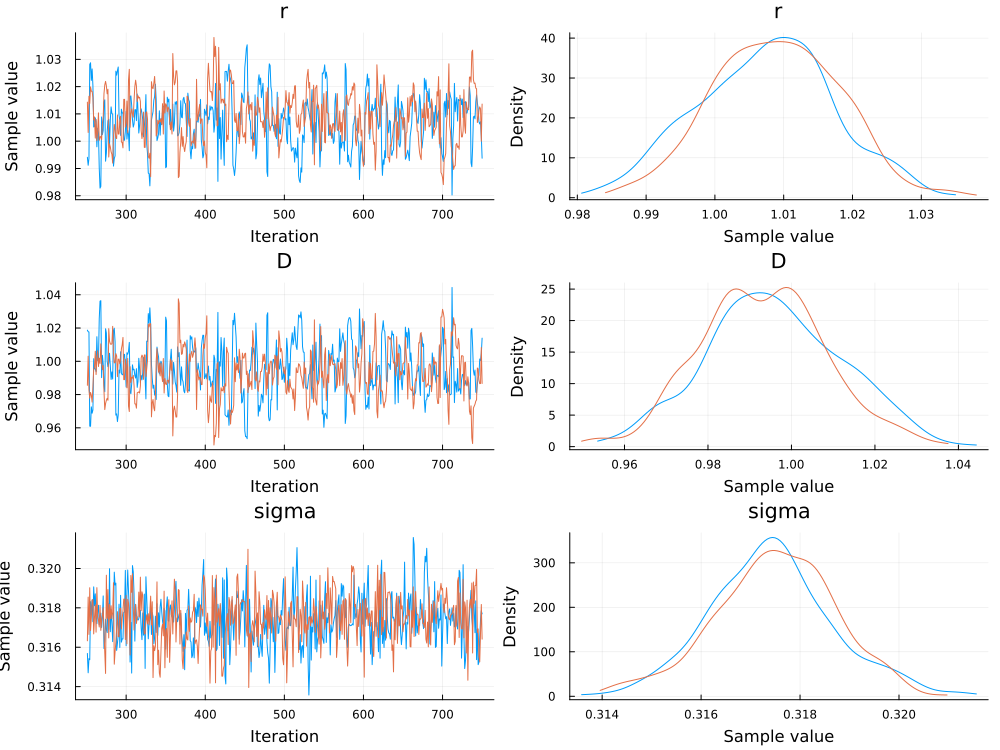

In [143]:
plot(chain3)